<a href="https://colab.research.google.com/github/claralin1222/SpotifyRecommenderSystem/blob/master/Spotify_Recommender_Systems_c.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Building Recommender Systems with Spotify Data

## Import Libraries

In [ ]:
!pip install spotipy


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.8/251.8 kB 6.4 MB/s eta 0:00:00


In [ ]:
!pip install datapane

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.6/143.6 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 857.8/857.8 kB 16.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 39.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 53.5 MB/s eta 0:00:00
  Created wheel for micawber: filename=micawber-0.5.5-py3-none-any.whl size=22435 sha256=92a366cac90e60f1775eaec44071d44f85b6f3a7afaa53e15cddee6a0ba8d8e8
  Stored in directory: /root/.cache/pip/wheels/31/3a/1f/bbd88c767423821f2fe497c0ada47581292f96419b56d689c0
Successfully built micawber
  Attempting uninstall: packaging
    Found existing installation: packaging 24.0
    Uninstalling packaging-24.0:
      Successfully uninstalled packaging-24.0
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0

In [ ]:
!pip install chart_studio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 2.4 MB/s eta 0:00:00


In [ ]:
import pyarrow.parquet as pa  # Import pyarrow and alias it as 'pa'
import numpy as np
import pandas as pd
import pyarrow as pa  # Import pyarrow module
import platform
import matplotlib.pyplot as plt
import seaborn as sns

from numpy import ravel
from sklearn.impute import SimpleImputer
from matplotlib import rcParams
from sklearn import preprocessing
from termcolor import colored as cl # text customization

from scipy.stats import pearsonr

from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.tree import DecisionTreeClassifier as dtc # tree algorithm
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split # splitting the data
from sklearn.metrics import accuracy_score # model precision
from sklearn.tree import plot_tree # tree diagram

from sklearn.ensemble import RandomForestClassifier


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import spotipy
import datapane as dp
import chart_studio.plotly as py
import chart_studio

import os
username = os.environ['PLOTLY_USERNAME'] = 'claralin1222'
api_key = os.environ['PLOTLY_API_KEY'] = 'CRoS8j7xPImK6J34mVAc'
chart_studio.tools.set_credentials_file(username=username, api_key=api_key)
plt.rcParams.update({'font.size': 22})
%matplotlib inline

## Reading the Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Clara's
spotify_data = pd.read_csv('/content/drive/MyDrive/IDS561 Analytics for Big Data/Group Project/spotify_data.csv')
genre_data = pd.read_csv('/content/drive/MyDrive/IDS561 Analytics for Big Data/Group Project/data_by_genres.csv')
data_by_year = pd.read_csv('/content/drive/MyDrive/IDS561 Analytics for Big Data/Group Project/data_by_year.csv')

In [ ]:
#Shirin
# Update file paths
spotify_data = pd.read_csv('/content/drive/MyDrive/Final Project 561/Group Project/spotify_data.csv')
genre_data = pd.read_csv('/content/drive/MyDrive/Final Project 561/Group Project/data_by_genres.csv')
data_by_year = pd.read_csv('/content/drive/MyDrive/Final Project 561/Group Project/data_by_year.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Final Project 561/Group Project/spotify_data.csv'

In [ ]:
spotify_data.head(10)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665
5,0.1960,1921,0.579,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.697,395076,0.346,0,4pyw9DVHGStUre4J6hPngr,0.168000,2,0.130,-12.506,1,Gati Mardika,6,1921,0.0700,119.824
6,0.4060,1921,0.996,['John McCormack'],0.518,159507,0.203,0,5uNZnElqOS3W4fRmRYPk4T,0.000000,0,0.115,-10.589,1,The Wearing of the Green,4,1921,0.0615,66.221
7,0.0731,1921,0.993,['Sergei Rachmaninoff'],0.389,218773,0.088,0,02GDntOXexBFUvSgaXLPkd,0.527000,1,0.363,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",2,1921,0.0456,92.867
8,0.7210,1921,0.996,['Ignacio Corsini'],0.485,161520,0.130,0,05xDjWH9ub67nJJk82yfGf,0.151000,5,0.104,-21.508,0,La Mañanita - Remasterizado,0,1921-03-20,0.0483,64.678
9,0.7710,1921,0.982,['Fortugé'],0.684,196560,0.257,0,08zfJvRLp7pjAb94MA9JmF,0.000000,8,0.504,-16.415,1,Il Etait Syndiqué,0,1921,0.3990,109.378


In [ ]:
spotify_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB


In [ ]:
data_by_year.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB


## Exploratory Data Analysis

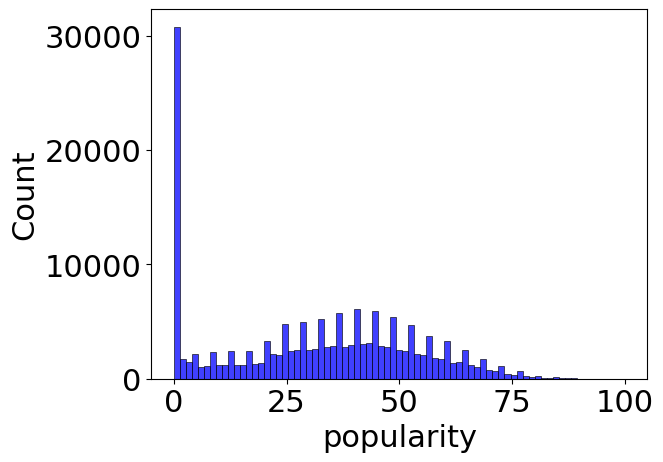

In [ ]:
# prompt: plot a histogram of column "popularity" from Spotify_data, put "popularity" label on the x-axis

import matplotlib.pyplot as plt
sns.histplot(spotify_data['popularity'], color = 'blue')
plt.xlabel('popularity')
plt.show()


### Music Over Time

In [ ]:
def get_decade(year):

    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)

    return decade

spotify_data['decade'] = spotify_data['year'].apply(get_decade)

<Axes: xlabel='count', ylabel='decade'>

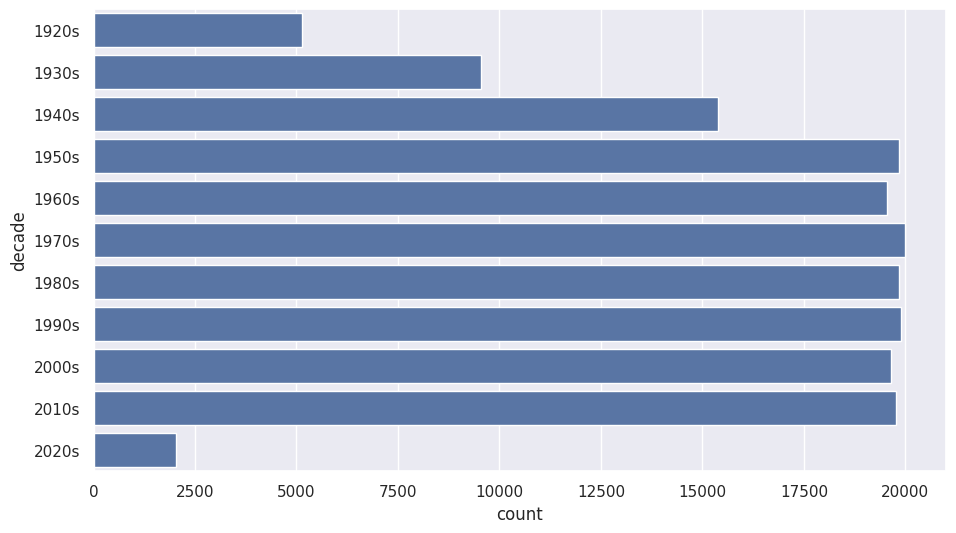

In [ ]:
sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(spotify_data['decade'])

In [ ]:
import plotly.express as px

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(data_by_year, x='year', y=sound_features)

fig.show()


#report = dp.Report(dp.Plot(fig) ) #Create a report
#report.publish(name='music_over_time', open=True, visibility='PUBLIC') #Publish the report

In [ ]:
fig = px.line(data_by_year, x='year', y='tempo')

fig.show()


#report = dp.Report(dp.Plot(fig) ) #Create a report
#report.publish(name='music_tempo_over_time', open=True, visibility='PUBLIC') #Publish the report

### Characteristics of Different Genres

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

In [ ]:
genre_data

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,1,zolo,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943,9
2969,0,zouglou,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000,7
2970,1,zouk,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667,5
2971,0,zurich indie,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000,7


In [ ]:
top10_genres

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
237,1,basshall,0.213167,0.81800,169799.166667,0.630167,0.000020,0.081067,-6.627833,0.134833,115.092500,0.588667,80.666667,2
2533,1,south african house,0.043833,0.84700,311854.333333,0.562333,0.130339,0.075133,-7.719000,0.050733,123.676333,0.834333,80.000000,1
2755,1,trap venezolano,0.044600,0.87700,231848.000000,0.777000,0.000035,0.086300,-4.246000,0.117000,102.020000,0.706000,80.000000,1
2778,0,turkish edm,0.008290,0.69800,186700.000000,0.719000,0.000004,0.326000,-4.923000,0.045500,120.062000,0.364000,80.000000,0
46,0,alberta hip hop,0.330000,0.88500,144000.000000,0.685000,0.000000,0.148000,-6.429000,0.062700,99.954000,0.937000,78.500000,11
536,0,chinese electropop,0.002570,0.66000,217088.000000,0.787000,0.000000,0.323000,-4.592000,0.032000,142.018000,0.199000,78.500000,1
37,0,afroswing,0.318450,0.71175,179995.375000,0.580187,0.000258,0.189950,-7.016687,0.195563,83.250125,0.676625,77.312500,11
31,0,afro soul,0.006270,0.76600,202627.000000,0.873000,0.000000,0.076400,-6.381000,0.143000,126.988000,0.743000,77.000000,11
575,1,circuit,0.009030,0.74500,189818.000000,0.972000,0.465000,0.297000,-3.506000,0.077400,128.031000,0.556000,77.000000,7
1239,1,guaracha,0.009030,0.74500,189818.000000,0.972000,0.465000,0.297000,-3.506000,0.077400,128.031000,0.556000,77.000000,7


In [ ]:
fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')

fig.show()


#report = dp.Report(dp.Plot(fig) ) #Create a report
#report.publish(name='sound_of_different_genres', open=True, visibility='PUBLIC') #Publish the report

## Clustering Genres

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from joblib import parallel_backend

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])

X = genre_data.select_dtypes(np.number)

with parallel_backend('threading'):
    cluster_pipeline.fit(X)

genre_data['cluster'] = cluster_pipeline.predict(X)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=2))])
genre_embedding = tsne_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.005s...
[t-SNE] Computed neighbors for 2973 samples in 0.349s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] Computed conditional probabilities in 0.086s
[t-SNE] Iteration 50: error = 78.8290024, gradient norm = 0.0289317 (50 iterations in 4.391s)
[t-SNE] Iteration 100: error = 76.2436981, gradient norm = 0.0013909 (50 iterations in 1.115s)
[t-SNE] Iteration 150: error = 76.1408386, gradient norm = 0.0004820 (50 iterations in 1.060s)
[t-SNE] Iteration 200: error = 76.1151123, gradient norm = 0.0001516 (50 iterations in 1.048s)
[t-SNE] Iteration 250: error = 76.1062317, gradient norm = 0.0000929 (50 iterations in 1.055s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106232
[t-SNE] Iteration 300: erro

In [ ]:
import plotly.express as px

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

## Clustering Songs

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import numpy as np

song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=2))], verbose=True)
X = spotify_data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Initialization complete
Iteration 0, inertia 1534246.6896988982.
Iteration 1, inertia 1165880.709606586.
Iteration 2, inertia 1132671.3710263812.
Iteration 3, inertia 1112708.2030912933.
Iteration 4, inertia 1093609.1054781398.
Iteration 5, inertia 1087014.0039759749.
Iteration 6, inertia 1083840.3274162817.
Iteration 7, inertia 1081558.001422559.
Iteration 8, inertia 1079706.3902662895.
Iteration 9, inertia 1078047.3944490345.
Iteration 10, inertia 1076431.4480518755.
Iteration 11, inertia 1074978.027087812.
Iteration 12, inertia 1073676.739090283.
Iteration 13, inertia 1072649.8141238103.
Iteration 14, inertia 1071893.4705217304.
Iteration 15, inertia 1071321.479358678.
Iteration 16, inertia 1070901.5277206062.
Iteration 17, inertia 1070615.4138580253.
Iteration 18, inertia 1070388.7812576946.
Iteration 19, inertia 1070189.6144881728.
Iteration 20, inertia 1070014.8792146612.
Iteration 21, inertia 1069858.4424905404.
Iteration 22, inertia 1069695.9290891248.
Iteration 23, inertia 106

Pipeline(steps=[('scaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=20, verbose=2))],
         verbose=True)

In [ ]:
song_cluster_labels = song_cluster_pipeline.predict(X)

In [ ]:
spotify_data['cluster_label'] = song_cluster_labels

In [ ]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = spotify_data['name']
projection['cluster'] = spotify_data['cluster_label']

In [ ]:
import plotly.express as px

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

## Building a Content-Based Recommender System

In [ ]:
import os
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

os.environ["SPOTIFY_CLIENT_ID"] = "0913b392869d4ccc9a264327fc9b834b"
os.environ["SPOTIFY_CLIENT_SECRET"] = "a89b34cc53f543488c9b6b66672f0120"

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=os.environ["SPOTIFY_CLIENT_ID"],
                                                          client_secret=os.environ["SPOTIFY_CLIENT_SECRET"]))

In [ ]:
from collections import defaultdict

def find_song(name, year):

    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,
                                                       year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]

    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)


In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')


In [ ]:
recommend_songs([{'name': 'Blinding Lights', 'year':2020},
                {'name': 'Dakiti', 'year': 2020},
                {'name': 'Put Your Records On', 'year': 2020},
                {'name': 'WHATS POPPIN (feat. DaBaby, Tory Lanez & Lil Wayne) - Remix', 'year': 2020},
                {'name': 'POPSTAR (feat. Drake)', 'year': 2020}],  spotify_data)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'name': 'For The Night (feat. Lil Baby & DaBaby)',
  'year': 2020,
  'artists': "['Pop Smoke', 'Lil Baby', 'DaBaby']"},
 {'name': "my ex's best friend (with blackbear)",
  'year': 2020,
  'artists': "['Machine Gun Kelly', 'blackbear']"},
 {'name': 'Smile (with The Weeknd)',
  'year': 2020,
  'artists': "['Juice WRLD', 'The Weeknd']"},
 {'name': 'Diva (feat. Lil Tecca)',
  'year': 2020,
  'artists': "['The Kid LAROI', 'Lil Tecca']"},
 {'name': 'nasty', 'year': 2020, 'artists': "['Ariana Grande']"},
 {'name': 'Falling Down - Bonus Track',
  'year': 2018,
  'artists': "['Lil Peep', 'XXXTENTACION']"},
 {'name': 'Truth Hurts', 'year': 2019, 'artists': "['Lizzo']"},
 {'name': "break up with your girlfriend, i'm bored",
  'year': 2019,
  'artists': "['Ariana Grande']"},
 {'name': 'Lemonade',
  'year': 2020,
  'artists': "['Internet Money', 'Gunna', 'Don Toliver', 'NAV']"}]

In [ ]:
recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  spotify_data)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (5,) + inhomogeneous part.

In [ ]:
recommend_songs([{'name': ''}])